In [1]:
import sys, importlib, os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torchvision.utils
from typing import Tuple
import yaml
from pathlib import Path
from datetime import datetime

In [2]:
# Importing project packages
cwd = Path(os.getcwd())
root_dir = cwd.parent

utils_dir = root_dir.joinpath('src','utils')
weights_dir = root_dir.joinpath('checkpoints','weights')
model_dir = root_dir.joinpath('src','model')
yaml_file_path = root_dir.joinpath('experiments','base_config.yaml')
lightning_model = root_dir.joinpath('src', 'training')


# Making packages importable
sys.path.append(str(root_dir))

In [3]:
from src.utils import WIP_SDE, WIP_processes
from src.models import components
from src.models import unet_model


importlib.reload(WIP_SDE)
importlib.reload(WIP_processes)
importlib.reload(components)
importlib.reload(unet_model)
# importlib.reload(LDMLightningModule)

UNet = unet_model.UNet
from src.utils.WIP_SDE import VESDE, SubVPSDE, VPSDE
from src.utils.WIP_processes import Diffusion_Processes
from src.training.ldm_module import LDMLightningModule
from src.models.components import SinusoidalPositionEmbeddings # Required by unet_model
#from src.models.unet_model import UNet

In [4]:
weights_name = "DM_final_T1000_LR0001_E3_GMM_ts20251218_223753.pth"

In [5]:
# Match your training cfg
test_cfg = {
    'N': 1000,
    'sde_type': 'vp', # or 've' / 'subvp'
    'channels': 4,    # Vital: Match your blob channel count
    'image_size': 32,
    'features': [128, 256, 512],
    'batch_size': 16,
    'vae_scale_factor': 0.18125,
    'learning_rate': 0.001,
    'channels': 4
}

device = "cpu"

hparams = {
        'learning_rate': test_cfg['learning_rate'],
        'n_timesteps': test_cfg['N'],
        'batch_size': test_cfg['batch_size'],
        'vae_scale_factor': test_cfg['vae_scale_factor']
    }

In [6]:
# 1. Instantiate the module as you did in setup()
# Note: You need to provide the same hparams/cfg used in training
unet_model = UNet(
        in_channels=test_cfg['channels'], 
        out_channels=test_cfg['channels'], 
        features=test_cfg['features']
    ).to(device)

ldm_module = LDMLightningModule(
    unet_model=unet_model, 
    diffusion_process=Diffusion_Processes(test_cfg),
    vae_encoder = None,
    vae_decoder = None,
    hparams=hparams,
    cfg=test_cfg
)

# 2. Load the raw state dict
checkpoint = torch.load(f"../checkpoints/weights/{weights_name}", map_location=device)
ldm_module.load_state_dict(checkpoint['state_dict'])

model = ldm_module.unet.eval().to(device)

In [7]:
import torch
from torch.utils.data import Dataset, DataLoader

class GMMDataset(Dataset):
    def __init__(self, num_samples=10000, num_modes=5, channels=4, size=32):
        self.num_samples = num_samples
        self.shape = (channels, size, size)
        
        # Define means for each mode (e.g., random but distinct patterns)
        # Scaling by 0.5 to keep data roughly in [-1, 1] range
        self.means = torch.randn(num_modes, channels, size, size) * 0.5
        # Define standard deviation for the clusters
        self.std = 0.05 

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        # Randomly select a mode
        mode = torch.randint(0, len(self.means), (1,)).item()
        # Sample from that specific Gaussian
        sample = self.means[mode] + torch.randn_like(self.means[mode]) * self.std
        return sample, mode

In [8]:
import matplotlib.pyplot as plt
from src.utils.WIP_processes import Diffusion_Processes

shape = (test_cfg['batch_size'],test_cfg['channels'], test_cfg['image_size'], test_cfg['image_size'])

def test_gmm_diffusion(model, cfg, ground_truth_means):
    device = "cpu"
    model.to(device)
    
    # Initialize the diffusion process (using your WIP_processes.py logic)
    diffusion = Diffusion_Processes(cfg)
    
    # Generate Samples from noise
    # Shape will be (batch_size, 4, 32, 32)
    shape = (cfg['batch_size'],cfg['channels'], cfg['image_size'], cfg['image_size'])
    samples = diffusion.reverse_process(model, shape, cfg['N'], device=device)
    
    # Visualization: Compare generated samples to ground truth means
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    samples_vis = samples.cpu().numpy()
    
    for i in range(4):
        # Visualize 1st channel of generated samples
        axes[0, i].imshow(samples_vis[i, 0, :, :], cmap='viridis')
        axes[0, i].set_title(f"Gen Sample {i}")
        
        # Visualize 1st channel of ground truth means
        axes[1, i].imshow(ground_truth_means[i, 0, :, :], cmap='viridis')
        axes[1, i].set_title(f"GT Mode {i}")
        
    plt.tight_layout()
    plt.show()

In [9]:
dataset = GMMDataset()

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020AB2F0A330>
This is the value of T: 1.0
Check prior vp: Mean = 0.002089323475956917, Std = 0.9985626935958862
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002573200617916882, std drift: 0.011037689633667469
Diffusion: mean diff 0.14135099947452545, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 5.276372394291684e-05, std_difference = 0.14199702441692352
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00025918130995705724, std drift: 0.011014861054718494
Diffusion: mean diff 0.14128059148788452, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.00045758840860798955, std_difference = 0.1419663280248642
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00025657378137111664, std drift: 0.011003680527210236
Diffusion: mean diff 0.14121012389659882, std diff: 0.0
Update: mean diff

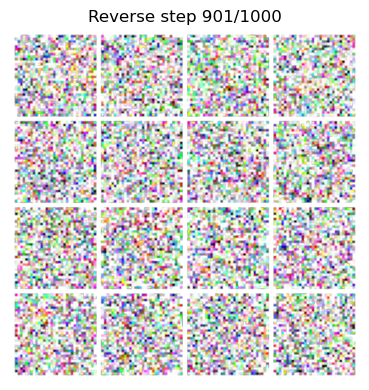

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002868609153665602, std drift: 0.00912235677242279
Diffusion: mean diff 0.1341271847486496, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0003026867052540183, std_difference = 0.13442477583885193
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002892546181101352, std drift: 0.00910670030862093
Diffusion: mean diff 0.13405297696590424, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -9.055125701706856e-05, std_difference = 0.13434608280658722
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002898863749578595, std drift: 0.009086464531719685
Diffusion: mean diff 0.1339787393808365, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0002571956138126552, std_difference = 0.1342822164297104
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean dr

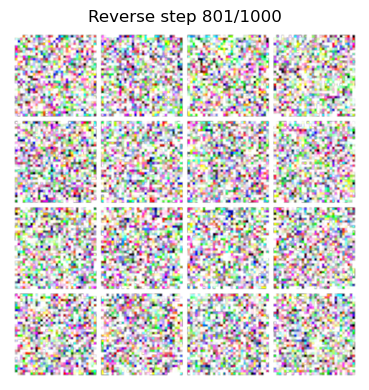

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00036498979898169637, std drift: 0.007416585460305214
Diffusion: mean diff 0.1264915019273758, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0004581630928441882, std_difference = 0.12670959532260895
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003674367326311767, std drift: 0.007399604190140963
Diffusion: mean diff 0.12641282379627228, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00145410792902112, std_difference = 0.12641891837120056
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00036735209869220853, std drift: 0.007378210313618183
Diffusion: mean diff 0.126334086060524, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.000930252717807889, std_difference = 0.1263352930545807
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean dri

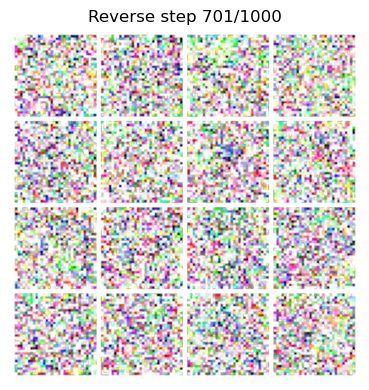

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0004440025659278035, std drift: 0.0058161113411188126
Diffusion: mean diff 0.11836427450180054, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0008079810068011284, std_difference = 0.11849074810743332
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00044395934673957527, std drift: 0.00579833472147584
Diffusion: mean diff 0.11828017979860306, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.00011197305866517127, std_difference = 0.11829590052366257
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00044510283623822033, std drift: 0.005785795394331217
Diffusion: mean diff 0.1181960254907608, std diff: 1.538985294757822e-08
Update: mean difference (x_new - x_prev): mean_difference = -0.00041629414772614837, std_difference = 0.11821714788675308
This is the current dt: 0.001
S

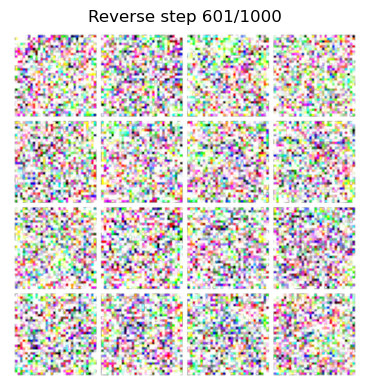

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005392824532464147, std drift: 0.004464361350983381
Diffusion: mean diff 0.10963623225688934, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.001218508230522275, std_difference = 0.1095694825053215
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005376612534746528, std drift: 0.004451334942132235
Diffusion: mean diff 0.10954545438289642, std diff: 1.538985294757822e-08
Update: mean difference (x_new - x_prev): mean_difference = 0.0006040856242179871, std_difference = 0.10961903631687164
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005387757555581629, std drift: 0.004440067335963249
Diffusion: mean diff 0.10945456475019455, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0005840250523760915, std_difference = 0.10973194986581802
This is the current dt: 0.001
Statist

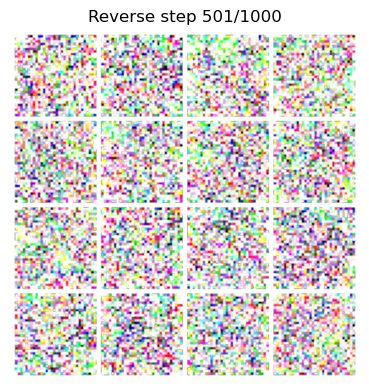

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0006075939163565636, std drift: 0.0036372914910316467
Diffusion: mean diff 0.10015039891004562, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0013277370017021894, std_difference = 0.10018356144428253
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.000608864997047931, std drift: 0.0036322346422821283
Diffusion: mean diff 0.10005099326372147, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0006621587090194225, std_difference = 0.09970409423112869
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0006104097701609135, std drift: 0.0036256792955100536
Diffusion: mean diff 0.09995149821043015, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0005989919882267714, std_difference = 0.100023053586483
This is the current dt: 0.001
Statistics for each timestep:
Drift: mea

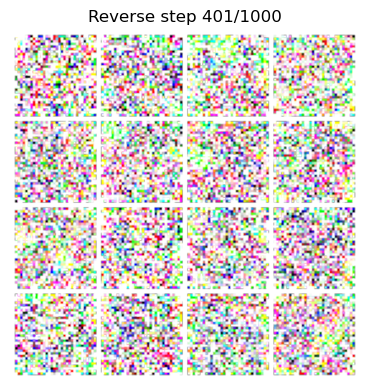

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.000633562623988837, std drift: 0.0032646695617586374
Diffusion: mean diff 0.08966660499572754, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.001268611871637404, std_difference = 0.08955315500497818
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0006342552369460464, std drift: 0.0032607638277113438
Diffusion: mean diff 0.08955556899309158, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.0006367773748934269, std_difference = 0.09000510722398758
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0006344484863802791, std drift: 0.00325802993029356
Diffusion: mean diff 0.08944440633058548, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0009352074121125042, std_difference = 0.08906441926956177
This is the current dt: 0.001
Statistics for each time

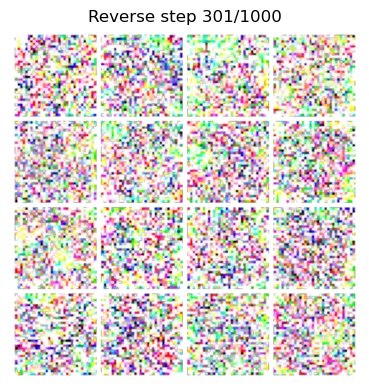

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005455247592180967, std drift: 0.0030213063582777977
Diffusion: mean diff 0.07778239250183105, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0010457554599270225, std_difference = 0.07821623980998993
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005442281253635883, std drift: 0.0030170693062245846
Diffusion: mean diff 0.07765436917543411, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0002938389661721885, std_difference = 0.07781454920768738
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005430434248410165, std drift: 0.003014392452314496
Diffusion: mean diff 0.07752612978219986, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0007805923232808709, std_difference = 0.07755164057016373
This is the current dt: 0.001
Statistics for each timestep:
Drift: m

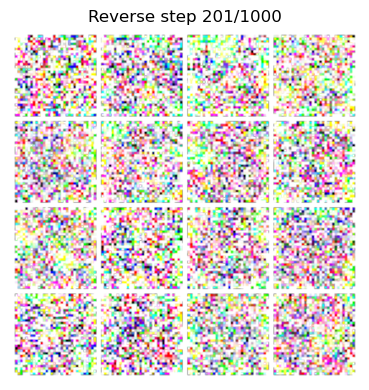

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003076292632613331, std drift: 0.002946108113974333
Diffusion: mean diff 0.06371891498565674, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 7.965708209667355e-05, std_difference = 0.06359479576349258
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003039836883544922, std drift: 0.0029483686666935682
Diffusion: mean diff 0.06356257200241089, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00026278954464942217, std_difference = 0.06328043341636658
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00030085688922554255, std drift: 0.0029504774138331413
Diffusion: mean diff 0.063405841588974, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0004988573491573334, std_difference = 0.06373568624258041
This is the current dt: 0.001
Statistics for each timestep:
Drift: m

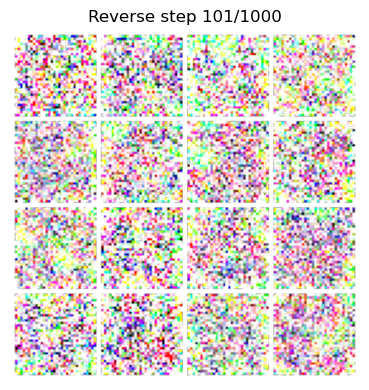

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 5.551970753003843e-05, std drift: 0.0035340534523129463
Diffusion: mean diff 0.04549834877252579, std diff: 3.847463236894555e-09
Update: mean difference (x_new - x_prev): mean_difference = -3.543886123225093e-05, std_difference = 0.045703329145908356
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 5.978987610433251e-05, std drift: 0.003543450264260173
Diffusion: mean diff 0.04527914151549339, std diff: 3.847463236894555e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0004614164063241333, std_difference = 0.045309893786907196
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 6.333545024972409e-05, std drift: 0.0035526282154023647
Diffusion: mean diff 0.045058850198984146, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0001565687416587025, std_difference = 0.045192573219537735
This is the current dt: 0.00

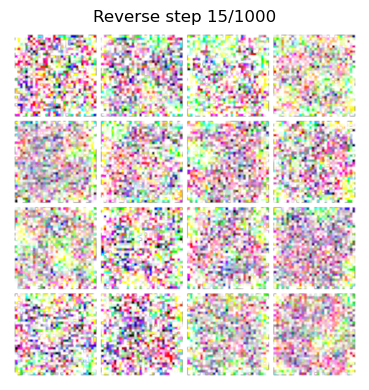

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00042875955114141107, std drift: 0.004591609351336956
Diffusion: mean diff 0.01893937774002552, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.00048201950266957283, std_difference = 0.019506268203258514
[reverse step 14/1000 | i=13 | t=0.0130]
mean=0.3472, std=1.8098, min=-22.8073, max=57.1371
Time of last 100 steps: 0.8728411197662354. Time remaining 86.4112708568573.



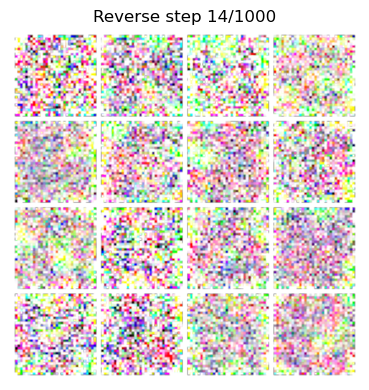

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00043539860052987933, std drift: 0.004625291563570499
Diffusion: mean diff 0.018406523391604424, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.00045320315985009074, std_difference = 0.01897180639207363
[reverse step 13/1000 | i=12 | t=0.0120]
mean=0.3468, std=1.8063, min=-22.7608, max=57.0915
Time of last 100 steps: 0.8725340366363525. Time remaining 86.3808696269989.



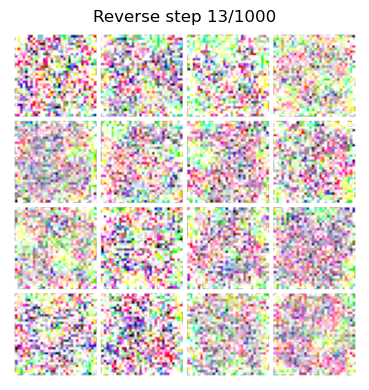

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00044439552584663033, std drift: 0.004664123058319092
Diffusion: mean diff 0.01785777322947979, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0006143987411633134, std_difference = 0.018454991281032562
[reverse step 12/1000 | i=11 | t=0.0110]
mean=0.3462, std=1.8025, min=-22.7444, max=57.0140
Time of last 100 steps: 0.940824031829834. Time remaining 93.14157915115356.



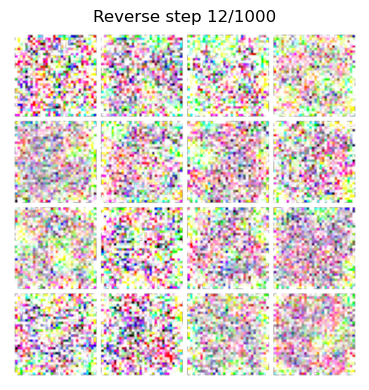

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.000451371306553483, std drift: 0.004710089415311813
Diffusion: mean diff 0.017291618511080742, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0004770475788973272, std_difference = 0.01791750080883503
[reverse step 11/1000 | i=10 | t=0.0100]
mean=0.3457, std=1.7988, min=-22.7584, max=56.9879
Time of last 100 steps: 0.8727710247039795. Time remaining 86.40433144569397.



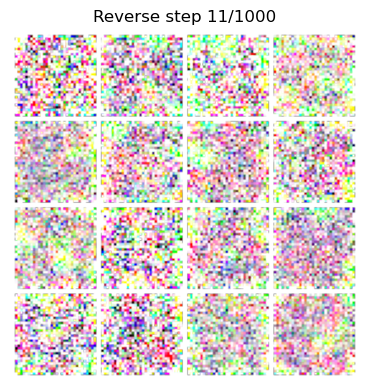

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00045975373359397054, std drift: 0.004764556884765625
Diffusion: mean diff 0.01670628786087036, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.00038198375841602683, std_difference = 0.017369933426380157
[reverse step 10/1000 | i=9 | t=0.0090]
mean=0.3453, std=1.7952, min=-22.7118, max=56.9601
Time of last 100 steps: 0.873563289642334. Time remaining 87.3563289642334.



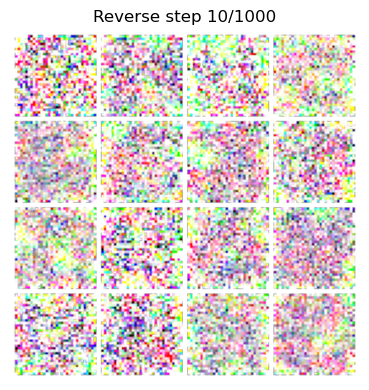

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00047010494745336473, std drift: 0.0048324535600841045
Diffusion: mean diff 0.01609969139099121, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0004986608400940895, std_difference = 0.01682380400598049
[reverse step 9/1000 | i=8 | t=0.0080]
mean=0.3448, std=1.7913, min=-22.6935, max=56.9050
Time of last 100 steps: 0.8778533935546875. Time remaining 87.78533935546875.



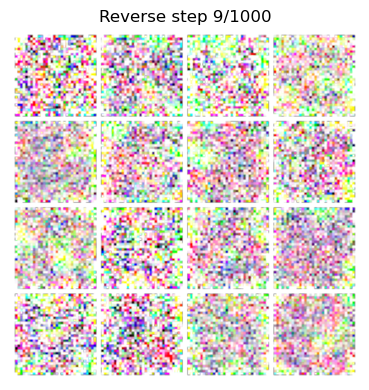

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.00048351590521633625, std drift: 0.004918547347187996
Diffusion: mean diff 0.015469326637685299, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0004062840307597071, std_difference = 0.016354989260435104
[reverse step 8/1000 | i=7 | t=0.0070]
mean=0.3444, std=1.7873, min=-22.6489, max=56.8705
Time of last 100 steps: 0.8664424419403076. Time remaining 86.64424419403076.



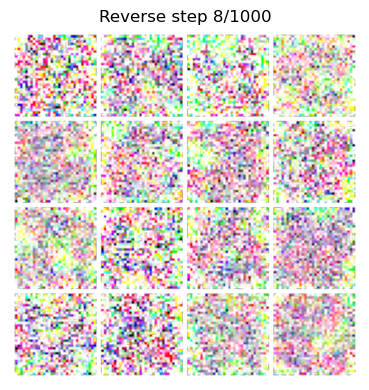

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0004992581671103835, std drift: 0.0050314064137637615
Diffusion: mean diff 0.014812157489359379, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0005339336930774152, std_difference = 0.0157029926776886
[reverse step 7/1000 | i=6 | t=0.0060]
mean=0.3439, std=1.7832, min=-22.6271, max=56.8336
Time of last 100 steps: 0.8864021301269531. Time remaining 88.64021301269531.



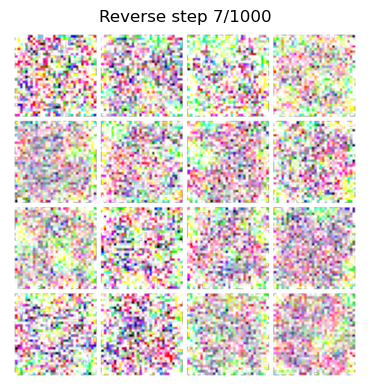

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005186892813071609, std drift: 0.005187352187931538
Diffusion: mean diff 0.014124446548521519, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0004466354730539024, std_difference = 0.015028278343379498
[reverse step 6/1000 | i=5 | t=0.0050]
mean=0.3434, std=1.7791, min=-22.5870, max=56.7800
Time of last 100 steps: 0.874133825302124. Time remaining 87.4133825302124.



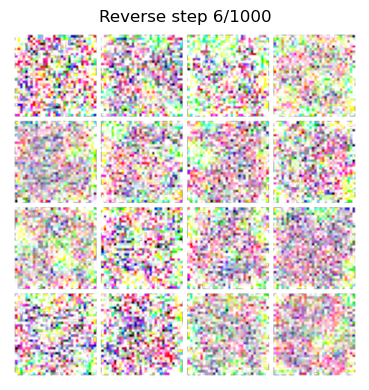

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005468076560646296, std drift: 0.005416045431047678
Diffusion: mean diff 0.013401494361460209, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0005691184778697789, std_difference = 0.014451947063207626
[reverse step 5/1000 | i=4 | t=0.0040]
mean=0.3429, std=1.7748, min=-22.5755, max=56.7302
Time of last 100 steps: 0.860661506652832. Time remaining 86.0661506652832.



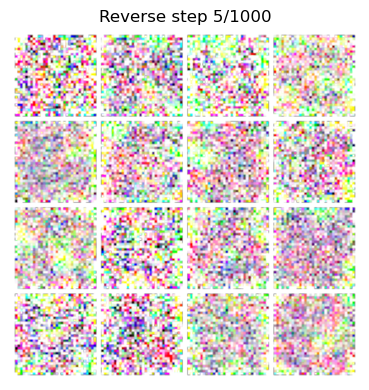

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.000590614858083427, std drift: 0.005783886183053255
Diffusion: mean diff 0.012637248262763023, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0006363133434206247, std_difference = 0.013885165564715862
[reverse step 4/1000 | i=3 | t=0.0030]
mean=0.3422, std=1.7702, min=-22.5208, max=56.6736
Time of last 100 steps: 0.8753800392150879. Time remaining 87.53800392150879.



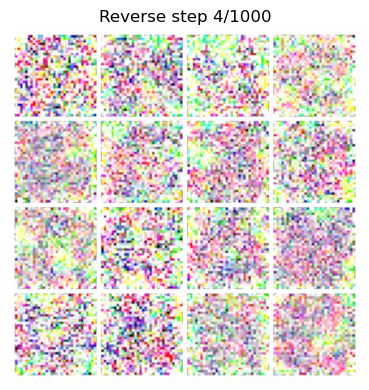

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0006670957081951201, std drift: 0.006470291875302792
Diffusion: mean diff 0.011823706328868866, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0006711886962875724, std_difference = 0.013475810177624226
[reverse step 3/1000 | i=2 | t=0.0020]
mean=0.3416, std=1.7649, min=-22.4939, max=56.6065
Time of last 100 steps: 0.8846468925476074. Time remaining 88.46468925476074.



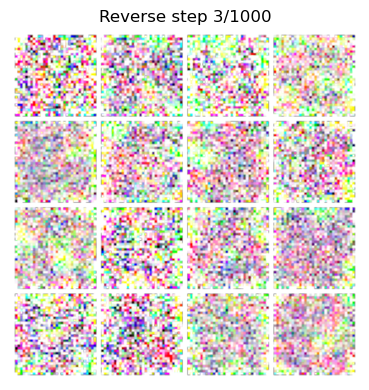

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0008581227157264948, std drift: 0.008220262825489044
Diffusion: mean diff 0.010949886403977871, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0009200726635754108, std_difference = 0.01370270550251007
[reverse step 2/1000 | i=1 | t=0.0010]
mean=0.3406, std=1.7582, min=-22.4520, max=56.5243
Time of last 100 steps: 0.8740079402923584. Time remaining 87.40079402923584.



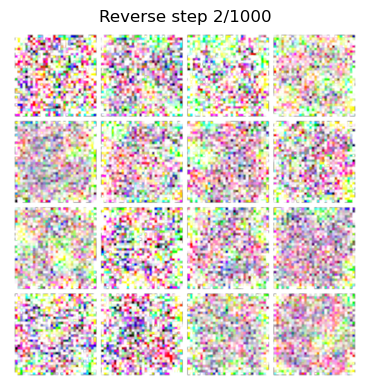

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 7.705323219299316, std drift: 72.48938751220703
Diffusion: mean diff 0.010000000707805157, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -7.705323219299316, std_difference = 72.48938751220703
[reverse step 1/1000 | i=0 | t=0.0000]
mean=-7.3647, std=71.0580, min=-687.6837, max=460.4384
Time of last 100 steps: 0.8738024234771729. Time remaining 87.38024234771729.



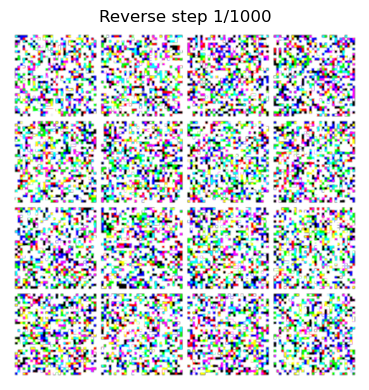

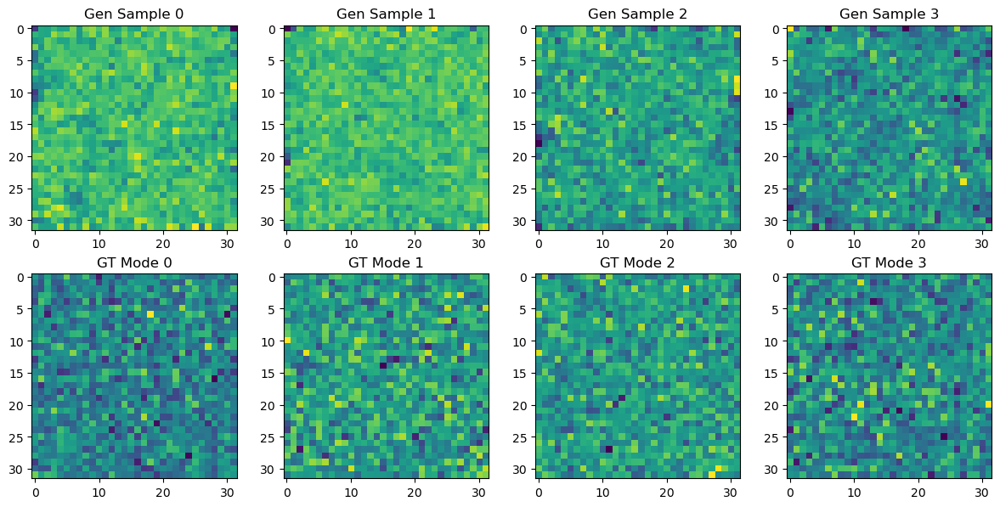

In [10]:
# Example usage:
test_gmm_diffusion(model, test_cfg, dataset.means)